In [53]:
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf

In [2]:
ad = sc.read_h5ad('../data/Xenium_AD_mouse.h5ad')

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/anndata/_core/anndata.py:1838: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [10]:
ad.obs['model-month'] = ad.obs['model'].astype(str)+'-'+ad.obs['age_months'].astype(str)

In [19]:
genes = [
    "C4b","C4a", "Serpina3n", "Gfap", "Gpnmb", "H2-D1", "Adamtsl1", "H2-K1", "Cd74", "S100a6", "Dkk2",
    "Apod", "Ndst4", "Cd44", "B2m", "Aspg", "Eya4", "Opalin", "Ifitm3", "Plp1", "Fos", "Cd63",
    "Gbp2", "Tyrobp", "Mpeg1", "Stat3", "Igfbp5", "Prph", "Osmr", "Tppp3", "Vim", "Cryab",
    "Itm2b", "Gatm", "Gjc3", "Gpx4", "Cnp", "Zfp536", "Apoe", "Sox10", "Plekhb1", "Picalm", "Clu",
    "Dpy19l1", "Clmn", "Prdx6", "Npc2", "Sparcl1", "Mbp", "Mobp", "Cst3"
]

In [29]:
genes = [
    "C4b","C4a", "Serpina3n", "Gfap", "Gpnmb", "H2-D1", "Adamtsl1", "H2-K1", "Cd74",
]

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


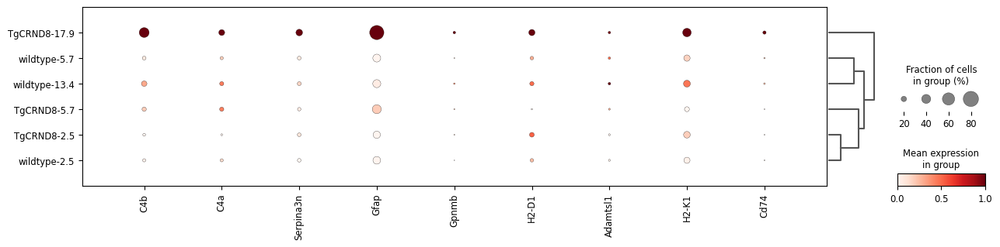

In [30]:
 sc.pl.dotplot(
        ad,
        var_names=genes,
        groupby="model-month",
        standard_scale="var",
        #dot_max=0.5,
        #dot_min=0.05,
        color_map="Reds",
        dendrogram=True,
        figsize=(15, 3)
    )

In [33]:
genes_by_source = {
    "regression": [  # First image
        "C4a", "Serpina3n", "Gfap", "Gpnmb", "H2-D1", "Adamtsl1", "H2-K1", "Cd74",
        "S100a6", "Dkk2", "Apod", "Ndst4", "Cd44", "B2m", "Aspg", "Eya4",
        "Opalin", "Ifitm3", "Plp1", "Fos"
    ],
    "correlation": [  # Second image
        "Cd63", "Gbp2", "Tyrobp", "Aspg", "Ndst4", "Mpeg1", "Cd44", "Stat3", "Igfbp5",
        "Prph", "Osmr", "Eya4", "Ifitm3", "Tppp3", "Gpnmb", "Cd74", "B2m", "Opalin",
        "Zfp536", "H2-K1", "Plp1", "Adamtsl1", "H2-D1", "Apod", "S100a6", "Vim",
        "Serpina3n", "Gfap", "C4a"
    ],
    "mutual information": [  # Third image
        "Cryab", "Itm2b", "Gatm", "Gjc3", "Gpx4", "Cnp", "Zfp536", "Apoe", "Tppp3",
        "Apod", "Opalin", "Sox10", "Plekhb1", "Picalm", "Clu", "Dpy19l1", "Clmn",
        "Prdx6", "Npc2", "Sparcl1"
    ],
    "cell level coexpression": [  # Fourth image
        "C4b", "Mbp", "Plp1", "Mobp", "Apod", "Cnp", "Plekhb1", "Gatm", "Cst3", "Apoe",
        "Itm2b", "Cryab", "Sparcl1", "Clu", "Gjc3", "Gpx4", "Prdx6", "Opalin", "Gfap", "Tppp3"
    ]
}

regression


/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


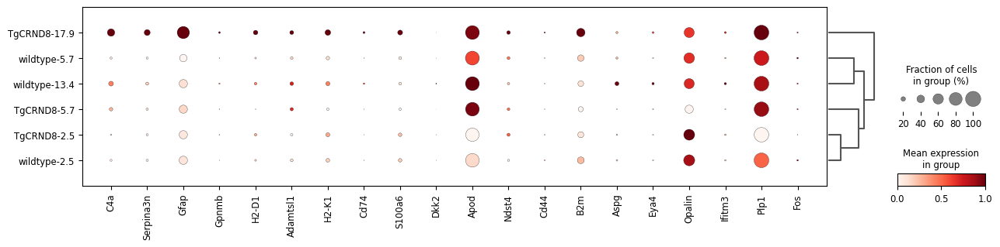

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


correlation


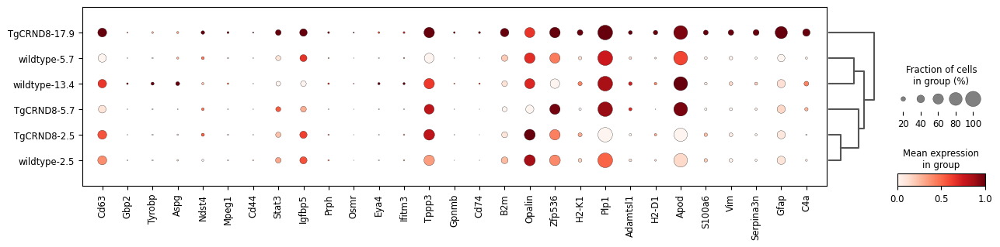

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


mutual information


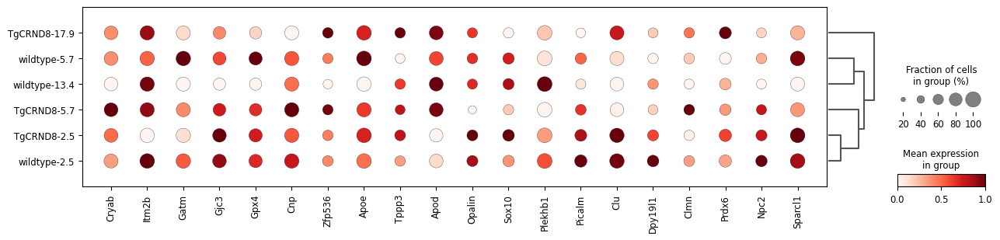

cell level coexpression


/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


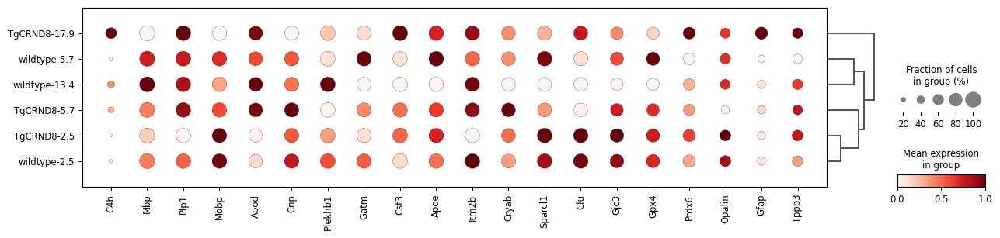

In [36]:
for i in genes_by_source.keys():
    print(i)
    sc.pl.dotplot(
    ad[ad.obs.cellType.str.contains('ligo')],
    var_names=genes_by_source[i],
    groupby="model-month",
    standard_scale="var",
    #dot_max=0.5,
    #dot_min=0.05,
    color_map="Reds",
    dendrogram=True,
    figsize=(15, 3)
    )

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


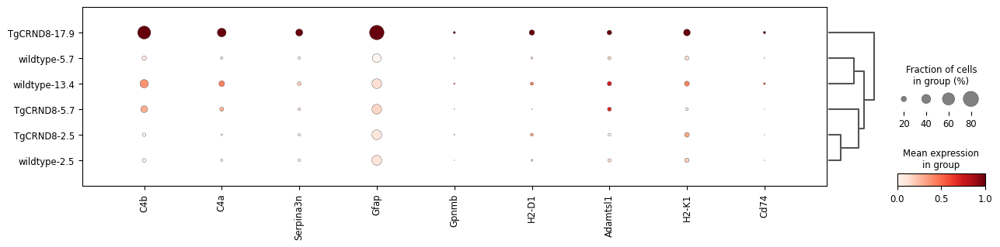

In [32]:
 sc.pl.dotplot(
        ad[ad.obs.cellType.str.contains('ligo')],
        var_names=genes,
        groupby="model-month",
        standard_scale="var",
        #dot_max=0.5,
        #dot_min=0.05,
        color_map="Reds",
        dendrogram=True,
        figsize=(15, 3)
    )

Xenium_V1_FFPE_TgCRND8_5_7_months_outs


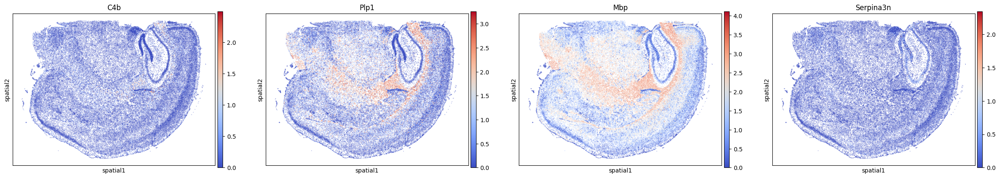

Xenium_V1_FFPE_wildtype_2_5_months_outs


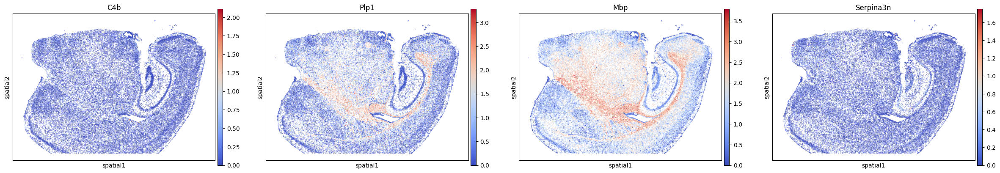

Xenium_V1_FFPE_wildtype_13_4_months_outs


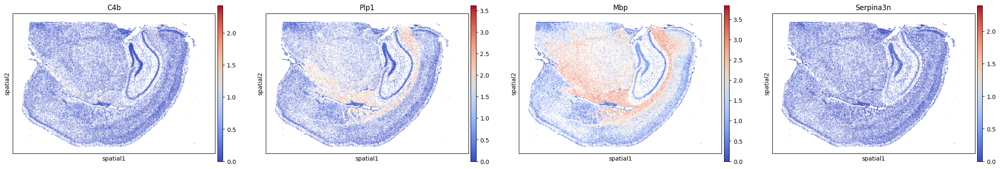

Xenium_V1_FFPE_wildtype_5_7_months_outs


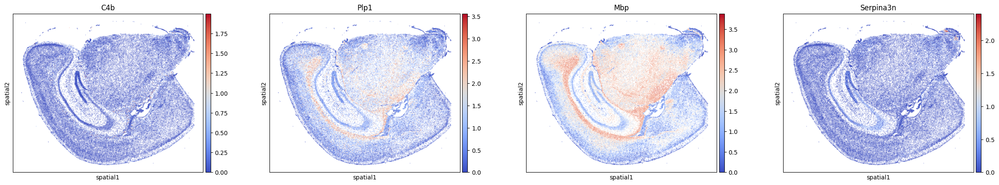

Xenium_V1_FFPE_TgCRND8_2_5_months_outs


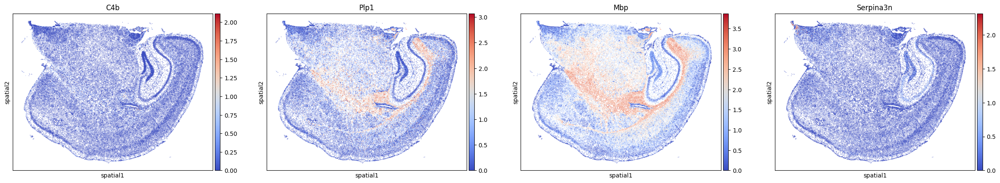

Xenium_V1_FFPE_TgCRND8_17_9_months_outs


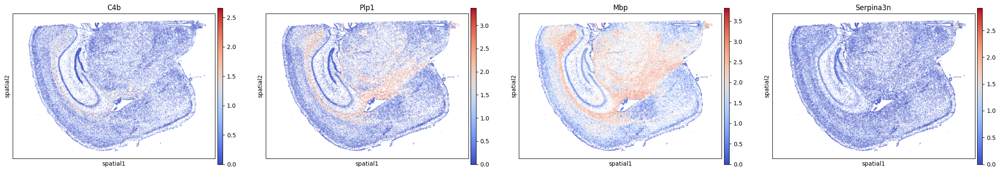

In [14]:
for i in ad.obs['run'].unique():
    print(i)
    ad_sub_sample = ad[ad.obs['run'] == i]
    sc.pl.spatial(
        ad_sub_sample, 
        color = ['C4b','Plp1', 'Mbp', 'Serpina3n'], 
        spot_size = 15, 
        cmap = 'coolwarm', 
    )

# modeling expression over disease course

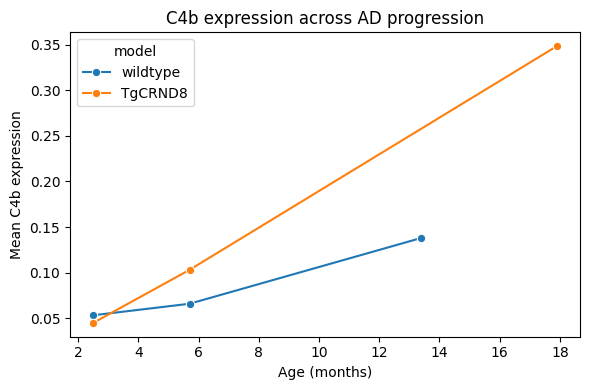

In [48]:
c4b_expr = (
    ad.obs.join(
        pd.DataFrame(
            ad[:, "C4b"].X.toarray().ravel(),
            index=ad.obs.index,
            columns=["C4b"]
        )
    )
    .groupby(["model", "age_months"])["C4b"]
    .mean()
    .reset_index()
)

plt.figure(figsize=(6,4))
sns.lineplot(data=c4b_expr, x="age_months", y="C4b", hue="model", marker="o")
plt.title("C4b expression across AD progression")
plt.xlabel("Age (months)")
plt.ylabel("Mean C4b expression")
plt.tight_layout()
plt.show()

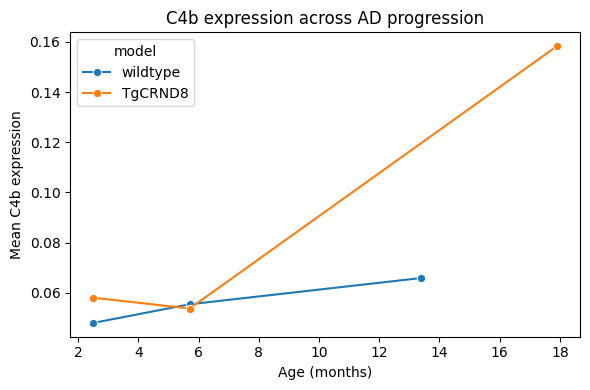

In [50]:
c4b_expr = (
    ad.obs.join(
        pd.DataFrame(
            ad[:, "Serpina3n"].X.toarray().ravel(),
            index=ad.obs.index,
            columns=["C4b"]
        )
    )
    .groupby(["model", "age_months"])["C4b"]
    .mean()
    .reset_index()
)

plt.figure(figsize=(6,4))
sns.lineplot(data=c4b_expr, x="age_months", y="C4b", hue="model", marker="o")
plt.title("C4b expression across AD progression")
plt.xlabel("Age (months)")
plt.ylabel("Mean C4b expression")
plt.tight_layout()
plt.show()

                  Mixed Linear Model Regression Results
Model:                   MixedLM      Dependent Variable:      C4b_resp  
No. Observations:        343860       Method:                  REML      
No. Groups:              6            Scale:                   0.0408    
Min. group size:         53076        Log-Likelihood:          62070.4266
Max. group size:         58739        Converged:               Yes       
Mean group size:         57310.0                                         
-------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------------
Intercept                       0.023    0.217  0.106 0.915 -0.403  0.449
C(model)[T.TgCRND8]            -0.025    0.290 -0.086 0.931 -0.594  0.544
age_months                      0.006    0.025  0.223 0.823 -0.044  0.056
age_months:C(model)[T.TgCRND8]  0.008    0.031  0.262 0.

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2262: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


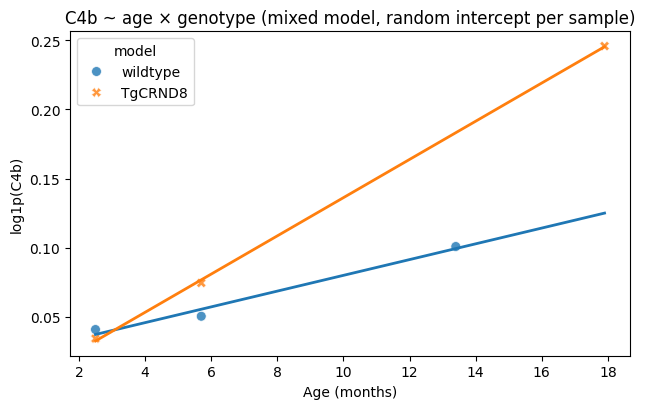

In [58]:
# =========================
# C4b ~ age * model (mixed model) + plotting
# =========================
# -------------------------
# 0) Settings
# -------------------------
GENE = "C4b"                 # gene to analyze
USE_LOG1P = True             # set False to model raw expression
SAMPLE_COL = "sample" if "sample" in ad.obs.columns else "run"
REQUIRED_COLS = [SAMPLE_COL, "model", "age_months"]  # model ∈ {"wildtype","TgCRND8"}

# Optional: focus on one cell type (uncomment & adjust)
# keep_mask = ad.obs["cell_type_reduced"].eq("Oligodendrocytes").values
# ad = ad[keep_mask].copy()

# -------------------------
# 1) Extract expression & build analysis frame (one row per cell)
# -------------------------
if GENE not in ad.var_names:
    raise ValueError(f"{GENE} not found in ad.var_names")

x = ad[:, GENE].X
x = x.toarray().ravel() if hasattr(x, "toarray") else np.asarray(x).ravel()

missing = [c for c in REQUIRED_COLS if c not in ad.obs.columns]
if missing:
    raise ValueError(f"Missing columns in ad.obs: {missing}")

df = ad.obs[REQUIRED_COLS].copy()
df[GENE] = x
df = df.dropna(subset=["age_months", "model"])  # be safe

if USE_LOG1P:
    df[f"{GENE}_resp"] = np.log1p(df[GENE])
    resp = f"{GENE}_resp"
    y_label = f"log1p({GENE})"
else:
    resp = GENE
    y_label = GENE

# -------------------------
# 2) Fit mixed model: random intercept per sample
# -------------------------
formula = f"{resp} ~ age_months * C(model)"  # tests slope difference via interaction
m = smf.mixedlm(formula, df, groups=df[SAMPLE_COL]).fit(method="lbfgs")
print(m.summary())

# Pretty print key coefficients
coef, ci = m.params, m.conf_int()
def ci_pair(name):
    return tuple(ci.loc[name].tolist()) if name in ci.index else (np.nan, np.nan)

print("\nKey terms:")
print("  age effect (wildtype baseline):",
      f"{coef.get('age_months', np.nan):.4g}", ci_pair("age_months"))
print("  genotype main (TgCRND8 vs WT at age=0):",
      f"{coef.get('C(model)[T.TgCRND8]', np.nan):.4g}", ci_pair("C(model)[T.TgCRND8]"))
print("  interaction age×TgCRND8 (slope difference):",
      f"{coef.get('age_months:C(model)[T.TgCRND8]', np.nan):.4g}",
      ci_pair("age_months:C(model)[T.TgCRND8]"))

# -------------------------
# 3) Prepare data for plotting
#    (a) per-sample means to visualize without overplotting
#    (b) model-predicted lines over an age grid
# -------------------------
# (a) Per-sample mean response (more readable than all cells)
per_sample = (df
              .assign(resp=df[resp])
              .groupby([SAMPLE_COL, "model", "age_months"], as_index=False)["resp"].mean())

# (b) Prediction grid (cartesian product of ages × model)
age_min, age_max = per_sample["age_months"].min(), per_sample["age_months"].max()
age_grid = np.linspace(age_min, age_max, 100)
models = ["wildtype", "TgCRND8"]
grid = pd.DataFrame({
    "age_months": np.repeat(age_grid, len(models)),
    "model": np.tile(models, len(age_grid))
})
grid["pred"] = m.predict(grid)

# -------------------------
# 4) Plot
# -------------------------
plt.figure(figsize=(6.5, 4.2))
sns.scatterplot(data=per_sample, x="age_months", y="resp",
                hue="model", style="model", s=50, alpha=0.8)
sns.lineplot(data=grid, x="age_months", y="pred", hue="model", lw=2, legend=False)
plt.xlabel("Age (months)")
plt.ylabel(y_label)
plt.title(f"{GENE} ~ age × genotype (mixed model, random intercept per sample)")
plt.tight_layout()
plt.show()

In [60]:
ad.obs.cellType.unique()

['Astrocytes', 'GABAergic interneurons', 'Oligodendrocytes', 'Oligodendrocyte progenitor cells', 'Microglia', 'Endothelial cells', 'Excitatory neurons', 'Pyramidal neurons', 'Lymphatic endothelial cells', 'Neurons']
Categories (10, object): ['Astrocytes', 'Endothelial cells', 'Excitatory neurons', 'GABAergic interneurons', ..., 'Neurons', 'Oligodendrocyte progenitor cells', 'Oligodendrocytes', 'Pyramidal neurons']

In [63]:
import numpy as np, pandas as pd
import statsmodels.formula.api as smf

# --- config ---
GENE = "C4b"
OLIGO_LABELS = {"Oligodendrocytes","DA Oligodendrocytes","Oligodendrocyte progenitor cells"}  # adjust as you like
sample_col = "sample" if "sample" in ad.obs.columns else "run"

# --- subset to oligodendrocytes ---
mask = ad.obs["cellType"].isin(OLIGO_LABELS)
ad_ol = ad[mask].copy()

# --- pull expression vector ---
if GENE not in ad_ol.var_names:
    raise ValueError(f"{GENE} not in var_names")
x = ad_ol[:, GENE].X
x = x.toarray().ravel() if hasattr(x, "toarray") else np.asarray(x).ravel()

# --- build per-cell data frame ---
need = [sample_col, "model", "age_months"]
missing = [c for c in need if c not in ad_ol.obs.columns]
if missing:
    raise ValueError(f"Missing columns: {missing}")

df = ad_ol.obs[need].copy()
df["C4b"] = x
df["C4b_log1p"] = np.log1p(df["C4b"])
df = df.dropna(subset=["age_months","model"])

# Optional: include compartment as fixed effect to soak up spatial heterogeneity
if "compartment" in ad_ol.obs.columns:
    df["compartment"] = ad_ol.obs["compartment"].values
    formula = "C4b_log1p ~ age_months * C(model) + C(compartment)"
else:
    formula = "C4b_log1p ~ age_months * C(model)"

# --- Mixed model: random intercept per sample ---
m_lmm = smf.mixedlm(formula, df, groups=df[sample_col]).fit(method="lbfgs")
print(m_lmm.summary())

# Key term: interaction age_months:C(model)[T.TgCRND8]

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:1635: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


                  Mixed Linear Model Regression Results
Model:                   MixedLM      Dependent Variable:      C4b_log1p 
No. Observations:        67606        Method:                  REML      
No. Groups:              6            Scale:                   0.0662    
Min. group size:         8931         Log-Likelihood:          -4175.7931
Max. group size:         12471        Converged:               Yes       
Mean group size:         11267.7                                         
-------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------------
Intercept                       0.007    0.026  0.274 0.784 -0.045  0.059
C(model)[T.TgCRND8]            -0.007    0.035 -0.208 0.835 -0.077  0.062
age_months                      0.014    0.003  4.486 0.000  0.008  0.020
age_months:C(model)[T.TgCRND8]  0.011    0.004  2.868 0.

In [66]:
df

,run,model,age_months,C4b,C4b_log1p
cell_id,,,,,
aaaegkaj-1,Xenium_V1_FFPE_TgCRND8_5_7_months_outs,TgCRND8,5.7,0.471509,0.386288
aaaihojk-1,Xenium_V1_FFPE_TgCRND8_5_7_months_outs,TgCRND8,5.7,0.000000,0.000000
aabbmoop-1,Xenium_V1_FFPE_TgCRND8_5_7_months_outs,TgCRND8,5.7,0.000000,0.000000
aabcbkcn-1,Xenium_V1_FFPE_TgCRND8_5_7_months_outs,TgCRND8,5.7,0.000000,0.000000
aabcfjmc-1,Xenium_V1_FFPE_TgCRND8_5_7_months_outs,TgCRND8,5.7,0.000000,0.000000
...,...,...,...,...,...
oimahdkp-1,Xenium_V1_FFPE_TgCRND8_17_9_months_outs,TgCRND8,17.9,0.000000,0.000000
oimchdjh-1,Xenium_V1_FFPE_TgCRND8_17_9_months_outs,TgCRND8,17.9,0.617723,0.481020
oimedjdn-1,Xenium_V1_FFPE_TgCRND8_17_9_months_outs,TgCRND8,17.9,0.241552,0.216362


In [68]:
m_lmm.model.formula

'C4b_log1p ~ age_months * C(model)'

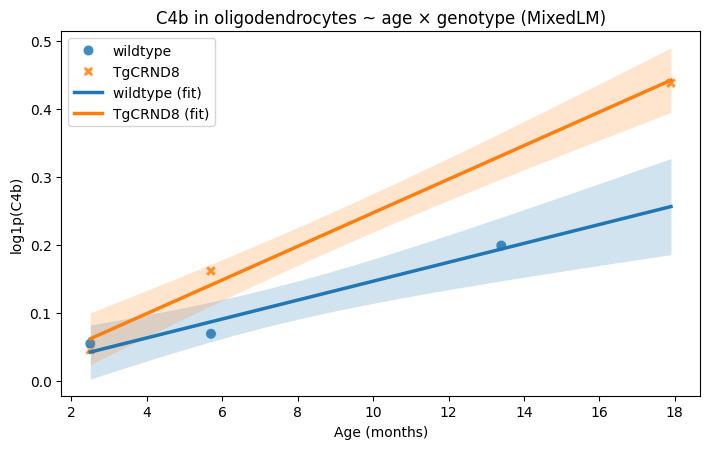

In [71]:
# --- Per-sample means (points) ---
per_sample = (df.groupby([sample_col, "model", "age_months"], as_index=False)["C4b_log1p"]
                .mean())

# --- Prediction grid (same ages for each model) ---
models = ["wildtype", "TgCRND8"]
age_min, age_max = per_sample["age_months"].min(), per_sample["age_months"].max()
age_grid = np.linspace(age_min, age_max, 120)
grid = pd.DataFrame({
    "age_months": np.repeat(age_grid, len(models)),
    "model": np.tile(models, len(age_grid))
})

# Ensure the 'model' categorical levels match the fitted model’s encoding
# (important for correct dummy columns)
if pd.api.types.is_categorical_dtype(df["model"]):
    cats = df["model"].cat.categories
    grid["model"] = pd.Categorical(grid["model"], categories=cats)
else:
    # make it categorical with the order seen in the training data
    order = list(df["model"].dropna().unique())
    grid["model"] = pd.Categorical(grid["model"], categories=order)

# --- Predictions from the mixed model ---
grid["pred"] = m_lmm.predict(grid)

# --- Build RHS design matrix for fixed-effects CI ---
import patsy as pt

# Extract RHS only (everything after "~") from the fitted formula
rhs = m_lmm.model.formula.split("~", 1)[1].strip()

# Build RHS design matrix; includes Intercept by default
X_design = pt.dmatrix(rhs, grid, return_type="dataframe")

# Align columns to the fixed-effect parameter order
fe_names = list(m_lmm.fe_params.index)  # e.g. ['Intercept','age_months', 'C(model)[T.TgCRND8]', 'age_months:C(model)[T.TgCRND8]']
# Some Patsy versions name the intercept 'Intercept'; ensure it exists:
if "Intercept" not in X_design.columns:
    # add intercept if Patsy omitted it (unlikely here)
    X_design.insert(0, "Intercept", 1.0)

# Keep columns in the exact order of fe_params
Xg = X_design[fe_names].to_numpy()

# Subset the covariance to fixed effects in the same order
cov_all = m_lmm.cov_params()  # DataFrame indexed by parameter names
cov_fe = cov_all.loc[fe_names, fe_names].to_numpy()

# Standard error of the mean prediction
se = np.sqrt(np.einsum("ij,jk,ik->i", Xg, cov_fe, Xg))

# 95% CI bands for the mean (fixed-effects)
grid["ci_lo"] = grid["pred"] - 1.96 * se
grid["ci_hi"] = grid["pred"] + 1.96 * se

# --- Plot: per-sample points + fitted lines with ribbons ---
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(7.2, 4.6))

sns.scatterplot(
    data=per_sample, x="age_months", y="C4b_log1p",
    hue="model", style="model", s=60, alpha=0.85
)

palette = sns.color_palette(n_colors=2)
for mdl, color in zip(models, palette):
    sub = grid[grid["model"] == mdl]
    plt.plot(sub["age_months"], sub["pred"], label=f"{mdl} (fit)", color=color, lw=2.5)
    plt.fill_between(sub["age_months"], sub["ci_lo"], sub["ci_hi"],
                     color=color, alpha=0.2, linewidth=0)

plt.xlabel("Age (months)")
plt.ylabel("log1p(C4b)")
plt.title("C4b in oligodendrocytes ~ age × genotype (MixedLM)")
plt.legend(title="")
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt

# ---------- CONFIG ----------
GENE_LIST = ["Serpina3n", "Gfap", "H2-D1", "B2m", "Mbp", "C4b", 'Plp1']  # candidates
OLIGO_LABELS = {"Oligodendrocytes","DA Oligodendrocytes","Oligodendrocyte progenitor cells"}
SAMPLE_COL = "sample" if "sample" in ad.obs.columns else "run"
MODEL_COL  = "model"   
AGE_COL    = "age_months"  
CELLTYPE_COL = "cell_type_reduced"  
FORMULA_RHS = f"{AGE_COL} * C({MODEL_COL})"   
# ----------------------------


def _match_gene_name(adata, symbol):
    s_low = symbol.lower()
    hits = [g for g in adata.var_names if g.lower() == s_low]
    if hits:
        return hits[0]
    if adata.raw is not None:
        hits = [g for g in adata.raw.var_names if g.lower() == s_low]
        if hits:
            return hits[0]
    if "gene_symbols" in adata.var.columns:
        mask = adata.var["gene_symbols"].astype(str).str.lower().eq(s_low)
        if mask.any():
            return adata.var_names[mask.to_numpy().nonzero()[0][0]]
    return None


def _extract_expr(adata, gene_name):
    if gene_name in adata.var_names:
        Xg = adata[:, gene_name].X
    elif adata.raw is not None and gene_name in getattr(adata.raw, "var_names", []):
        Xg = adata.raw[:, gene_name].X
    else:
        return None
    return Xg.toarray().ravel() if hasattr(Xg, "toarray") else np.asarray(Xg).ravel()


def mixed_model_screen_genes(
    adata,
    genes,
    oligo_labels=OLIGO_LABELS,
    sample_col=SAMPLE_COL,
    model_col=MODEL_COL,
    age_col=AGE_COL,
    celltype_col=CELLTYPE_COL,
    formula_rhs=FORMULA_RHS,
    add_compartment=False,
    compartment_col="compartment",
    log1p=True,
    verbose=True,
    make_volcano=True
):
    # ---- subset to oligodendrocytes ----
    if celltype_col in adata.obs.columns:
        mask = adata.obs[celltype_col].isin(oligo_labels)
        ad_sub = adata[mask].copy()
    else:
        ad_sub = adata

    # required cols
    need = [sample_col, model_col, age_col]
    missing = [c for c in need if c not in ad_sub.obs.columns]
    if missing:
        raise ValueError(f"Missing columns in ad.obs: {missing}")
    if not np.issubdtype(ad_sub.obs[age_col].dtype, np.number):
        raise ValueError(f"{age_col} must be numeric (months).")

    # optional compartment covariate
    rhs = formula_rhs
    if add_compartment and (compartment_col in ad_sub.obs.columns):
        rhs = rhs + f" + C({compartment_col})"

    results = []
    n_total = len(genes)

    base_df = ad_sub.obs[[sample_col, model_col, age_col]].copy()
    if add_compartment and (compartment_col in ad_sub.obs.columns):
        base_df[compartment_col] = ad_sub.obs[compartment_col].values

    for i, sym in enumerate(genes, 1):
        g = _match_gene_name(ad_sub, sym)
        if g is None:
            if verbose:
                print(f"[{i}/{n_total}] Skipping '{sym}': not found in var_names/raw.")
            continue

        y = _extract_expr(ad_sub, g)
        if y is None:
            if verbose:
                print(f"[{i}/{n_total}] Skipping '{sym}': expression not retrievable.")
            continue

        df_gene = base_df.copy()
        df_gene["y"] = np.log1p(y) if log1p else y
        df_gene = df_gene.dropna(subset=[age_col, model_col, "y"])

        try:
            fit = smf.mixedlm(f"y ~ {rhs}", df_gene, groups=df_gene[sample_col]).fit(
                reml=True, method="lbfgs", disp=False
            )
            inter_name = f"{age_col}:C({model_col})[T.TgCRND8]"
            coef = fit.fe_params.get(inter_name, np.nan)
            pval = fit.pvalues.get(inter_name, np.nan)
            age_coef = fit.fe_params.get(age_col, np.nan)
            results.append({
                "gene": sym,
                "matched_var": g,
                "interaction_coef": coef,
                "interaction_pval": pval,
                "age_coef_wt": age_coef,
                "n_cells": len(df_gene),
                "log1p": log1p
            })
            if verbose and (i % 10 == 0 or i == n_total):
                print(f"[{i}/{n_total}] {sym}: inter={coef:.4g}, p={pval:.3g}, n={len(df_gene)}")
        except Exception as e:
            if verbose:
                print(f"[{i}/{n_total}] FAILED '{sym}': {e}")
            continue

    res = pd.DataFrame(results).sort_values("interaction_pval", na_position="last").reset_index(drop=True)

    if make_volcano and not res.empty:
        res["mlog10p"] = -np.log10(res["interaction_pval"].clip(lower=1e-300))
        plt.figure(figsize=(7,5))
        plt.scatter(res["interaction_coef"], res["mlog10p"], s=18, alpha=0.7)
        top = res.nsmallest(10, "interaction_pval")
        for _, r in top.iterrows():
            plt.text(r["interaction_coef"], r["mlog10p"], r["gene"], fontsize=8,
                     ha="left", va="bottom")
        plt.axvline(0, ls="--", lw=1, color="gray")
        plt.xlabel("Interaction effect  (age × TgCRND8)")
        plt.ylabel("-log10(p)")
        plt.title("Genes with divergent age trajectories (OLs)")
        plt.tight_layout()
        plt.show()

    return res


# ---------- RUN ----------
res = mixed_model_screen_genes(
    ad,
    genes=GENE_LIST,
    oligo_labels=OLIGO_LABELS,
    sample_col=SAMPLE_COL,
    model_col=MODEL_COL,
    age_col=AGE_COL,
    celltype_col=CELLTYPE_COL,
    add_compartment=False,
    log1p=True,
    verbose=True,
    make_volcano=True
)

res.head(10)



/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2262: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
